<a href="https://colab.research.google.com/github/Blaise-bf/thesis-files/blob/main/thesis_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install segmentation_models_pytorch --quiet
!pip install torchsummary --quiet
!pip install torchmetrics --quiet
!pip install -U albumentations --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 126.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 88.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from torchvision import transforms
import pandas as pd
import numpy as np
from PIL import Image
import cv2
import torch
import torch.nn as nn
import segmentation_models_pytorch as smp
import os
import matplotlib.pyplot as plt
import pandas as pd
from torchmetrics.segmentation import DiceScore



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
import numpy as np

def resize_to_square(
    img: np.ndarray,
    target_size: int,
    pad_color: int = 0,
    interpolation: int = cv2.INTER_CUBIC
) -> np.ndarray:
    """
    Resizes an image to a square while maintaining aspect ratio.
    Pads the remaining space with `pad_color` (default: 0/black).

    Args:
        img (np.ndarray): Input image (grayscale or color).
        target_size (int): Desired width & height of the square output.
        pad_color (int): Padding color (default 0 for black).

    Returns:
        np.ndarray: Square image of size (target_size, target_size).
    """
    h, w = img.shape[:2]

    # Scale the image to fit inside the target square
    scale = min(target_size / w, target_size / h)
    new_w = int(w * scale)
    new_h = int(h * scale)
    resized_img = cv2.resize(img, (new_w, new_h), interpolation=interpolation )

    # Calculate padding to center the image
    delta_w = target_size - new_w
    delta_h = target_size - new_h
    top = delta_h // 2
    bottom = delta_h - top
    left = delta_w // 2
    right = delta_w - left

    # Apply padding
    square_img = cv2.copyMakeBorder(
        resized_img,
        top, bottom, left, right,
        cv2.BORDER_CONSTANT,
        value=pad_color
    )

    return square_img


def read_image_frompath(
    mask_paths: list[str],
    size: int | None = None,
    pad_color: int = 0,
    interpolation: int = cv2.INTER_CUBIC
) -> list[np.ndarray]:
    """
    Reads images from paths and optionally resizes them to squares.

    Args:
        mask_paths (list[str]): List of image file paths.
        size (int | None): If provided, resize images to (size x size).
        pad_color (int): Padding color (default 0 for black).

    Returns:
        list[np.ndarray]: List of images (resized if `size` is given).
    """
    images = []
    for path in mask_paths:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"Warning: Could not read image at {path}")
            continue

        if size is not None:
            img = resize_to_square(img, size, pad_color, interpolation)
        images.append(img)

    return images


def load_base_unetmodel():
    model = smp.UnetPlusPlus(
    encoder_name="efficientnet-b4",  # EfficientNet-b4 encoder
    encoder_weights="imagenet",      # Pretrained weights
    in_channels=1,                   # RGB channels
    classes=1                       # Single binary mask class
)
    return model


In [ ]:
service = 'colab'
# Read in meta data
met_df = pd.read_excel('/content/drive/MyDrive/msc_uhasselt/cath_ai_rev_anon.xlsx')
met_df.rename(columns={'arch (1-ok, 0-no)': 'arch',
                                 'tip (1-ok, 0-no)' : 'tip' }, inplace=True)


if service == 'kaggle':
# Paths to images
    train_ctheter_mask_dir = '/kaggle/input/thesis-files/train_catheter_masks/train_catheter_masks'
    test_ctheter_mask_dir = '/kaggle/input/thesis-files/test_catheter_masks'
    train_atrium_mask_dir = '/kaggle/input/thesis-files/train_atrium_masks/train_atrium_masks'
    test_atrium_mask_dir = '/kaggle/input/thesis-files/test_atrium_masks'
    original_images_dir = '/kaggle/input/thesis-files/train_images/train_images'
    original_test_images_dir = '/kaggle/input/thesis-files/test_images'
else:
    train_ctheter_mask_dir = '/content/drive/MyDrive/msc_uhasselt/train_catheter_masks'
    test_ctheter_mask_dir = '/content/drive/MyDrive/msc_uhasselt/test_catheter_masks'
    train_atrium_mask_dir = '/content/drive/MyDrive/msc_uhasselt/train_atrium_masks'
    test_atrium_mask_dir = '/content/drive/MyDrive/msc_uhasselt/test_atrium_masks'
    original_images_dir = '/content/drive/MyDrive/msc_uhasselt/train_images'
    original_test_images_dir = '/content/drive/MyDrive/msc_uhasselt/test_images'




def get_filenames(dir_path):
    filenames = [f for f in os.listdir(dir_path) if f.endswith('.tif')]
    return filenames

def get_ids(filenames):
    ids = {f.split('.')[0] for f in filenames}
    return ids

def get_full_paths(dir_path, filenames):
    full_paths = [os.path.join(dir_path, f"{img_id}.tif") for img_id in filenames]
    return full_paths


# Get filenames (not full paths yet)
catheter_labels = get_filenames(train_ctheter_mask_dir)
atrial_labels = get_filenames(train_atrium_mask_dir)
test_catheter_labels = get_filenames(test_ctheter_mask_dir)
test_atrial_labels = get_filenames(test_atrium_mask_dir)

# Extract IDs
# The files typically have this form 'IMG-0025-00001.tif'
# A set data structure is used to ensure set concepts like intersection or union can be used
ids_cath = {f.split('.')[0] for f in catheter_labels} # this should return ids like IMG-0025-00001
ids_atria = {f.split('.')[0] for f in atrial_labels}
test_cath_ids = {f.split('.')[0] for f in test_catheter_labels}
test_atria_ids = {f.split('.')[0] for f in test_atrial_labels}

# Find common IDs
common_ids = sorted(list(ids_cath.intersection(ids_atria)))  # sorted is optional, but keeps things in order
common_ids_test = sorted(list(test_cath_ids.intersection(test_atria_ids)))

common_ids_test.remove('IMG-0273-00001') # This image returns blank predictions for both masks
common_ids_test = sorted(common_ids_test)

# Now build matched paths
valid_cathetr_paths = get_full_paths(train_ctheter_mask_dir, common_ids)
valid_atrial_paths = get_full_paths(train_atrium_mask_dir, common_ids)
valid_test_cathetr_paths = get_full_paths(test_ctheter_mask_dir, common_ids_test)
valid_test_atrial_paths = get_full_paths(test_atrium_mask_dir, common_ids_test)
valid_images_paths = get_full_paths(original_images_dir, common_ids)
valid_test_paths = get_full_paths(original_test_images_dir, common_ids_test)

print(f"Number of images: {len(valid_images_paths)}")
print(f"Number of catheter masks: {len(valid_cathetr_paths)}")
print(f"Number of atrial masks: {len(valid_atrial_paths)}")
print(f"Number of test images: {len(valid_test_paths)}")
print(f"Number of test catheter masks: {len(valid_test_cathetr_paths)}")
print(f"Number of test atrial masks: {len(valid_test_atrial_paths)}")


Number of images: 200
Number of catheter masks: 200
Number of atrial masks: 200
Number of test images: 45
Number of test catheter masks: 45
Number of test atrial masks: 45


In [4]:
import os
import requests

def download_file(url, local_filename):
    """Download a file from a URL to a local file."""
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(local_filename, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                f.write(chunk)
    return local_filename





def save_file_locally(url, local_file_name):
    if not os.path.exists(local_file_name):
        print(f"File {local_file_name} not found. Downloading from GitHub...")
        try:
            download_file(url, local_file_name)
            print(f"Successfully downloaded {local_file_name}")
        except Exception as e:
            print(f"Failed to download file: {e}")
    else:
        print(f"File {local_file_name} already exists")



file_info = {
    'layers' : ("https://raw.githubusercontent.com/Blaise-bf/unet/refs/heads/master/models/layers.py", 'layers.py'),
    'model'  : ('https://raw.githubusercontent.com/Blaise-bf/unet/refs/heads/master/models/UNet_3Plus.py', 'unet_3plus.py'),
    'weights' : ('https://raw.githubusercontent.com/Blaise-bf/unet/refs/heads/master/models/init_weights.py', 'init_weights.py')
}

for key in file_info.keys():
    info = file_info[key]
    save_file_locally(info[0], info[1])


File layers.py not found. Downloading from GitHub...
Successfully downloaded layers.py
File unet_3plus.py not found. Downloading from GitHub...
Successfully downloaded unet_3plus.py
File init_weights.py not found. Downloading from GitHub...
Successfully downloaded init_weights.py


In [ ]:
from unet_3plus import *

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
import torch
import numpy as np
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import cv2
from typing import List, Optional, Tuple


class SegmentationDataset(Dataset):
    def __init__(
        self,
        image_paths: List[str],
        mask_paths: List[str],
        image_size: int = 720,
        transform: Optional[transforms.Compose] = None,
        apply_clahe: bool = True,
        clahe_limit: float = 2.0,
        clahe_tile_grid_size: Tuple[int, int] = (8, 8)
    ):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.image_size = image_size
        self.transform = transform
        self.apply_clahe = apply_clahe
        self.clahe_limit = clahe_limit
        self.clahe_tile_grid_size = clahe_tile_grid_size

        # Validate inputs
        if len(image_paths) != len(mask_paths):
            raise ValueError("Number of images and masks must be equal")

        # Image normalization transform
        self.normalize = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize to [-1, 1] range
        ])

    def __len__(self) -> int:
        return len(self.image_paths)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, torch.Tensor]:
        # Load image and mask
        # image = Image.open(self.image_paths[idx]).convert('L')  # Convert to grayscale
        # mask = Image.open(self.mask_paths[idx]).convert('L')
        # Use Open cv to read in gray scale image and mask
        image = cv2.imread(self.image_paths[idx], cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)

        # Apply CLAHE for contrast enhancement if enabled
        if self.apply_clahe:
            # image_np = np.array(image)
            clahe = cv2.createCLAHE(clipLimit=self.clahe_limit, tileGridSize=self.clahe_tile_grid_size)
            image = Image.fromarray(clahe.apply(image))

        # Resize both image and mask
        image = self._resize_to_square(np.array(image), self.image_size)
        mask = self._resize_to_square(np.array(mask), self.image_size)

        # Convert mask to binary (0 or 1)
        mask = (mask > 0).astype(np.float32)  # float32 for PyTorch compatibility

        # Convert to PIL for potential transforms
        # image_pil = Image.fromarray(image)
        # mask_pil = Image.fromarray(mask)

        # Apply additional transforms if specified

        augmented = train_transform(image=image, mask=mask)
            # image_pil = self.transform(image_pil)
            # mask_pil = self.transform(mask_pil)

        # Apply normalization to image only
        image_tensor = augmented['image']
        mask_tensor = augmented['mask'] # Add channel dimension

        if mask_tensor.ndim == 2:
            mask_tensor = mask_tensor.unsqueeze(0)

        return image_tensor, mask_tensor

    @staticmethod
    def _resize_to_square(image: np.ndarray, size: int) -> np.ndarray:
        """Resize image to square while maintaining aspect ratio with padding"""
        h, w = image.shape
        scale = size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)

        resized = cv2.resize(image, (new_w, new_h))

        # Pad to make square
        delta_w = size - new_w
        delta_h = size - new_h
        top = delta_h // 2
        bottom = delta_h - top
        left = delta_w // 2
        right = delta_w - left

        return cv2.copyMakeBorder(
            resized,
            top, bottom, left, right,
            cv2.BORDER_CONSTANT,
            value=0
        )

In [ ]:
from math import pi
from torch.utils.data import DataLoader
import albumentations as A
# Example transforms for data augmentation

import albumentations as A

import albumentations as A
import cv2

train_transform = A.Compose([
    # --- Spatial Augmentations ---
    A.HorizontalFlip(p=0.3),  # Safe for atrial anatomy

    # Finer GridDistortion (controlled warping)
    A.GridDistortion(
        num_steps=5,           # Smoother transitions (default=5)
        distort_limit=0.15,    # Reduced from 0.3 (gentler distortion)
        interpolation=cv2.INTER_LINEAR,
        border_mode=cv2.BORDER_CONSTANT,
        p=0.3
    ),

    # Optional: Combined with ElasticTransform
    A.OneOf([
        A.ElasticTransform(
            alpha=120,         # Magnitude of distortion (reduced from default)
            sigma=120 * 0.05,  # Smoothness (sigma=alpha*factor)
            # alpha_affine=0,    # No longer a parameter - removed
            p=0.5
        ),
        A.GridDistortion(distort_limit=0.1, p=0.5)  # Even subtler variant
    ], p=0.4),

    # --- Intensity Augmentations ---
    # A.CLAHE(clip_limit=2.0, p=0.3),
    A.RandomBrightnessContrast(
        brightness_limit=(-0.1, 0.1),
        contrast_limit=(-0.1, 0.1),
        p=0.4
    ),
    A.GaussNoise(std_range=(0.01, 0.02), p=0.2),
    # --- Normalization ---
    A.Normalize(mean=(0.485), std=(0.229)),
    A.ToTensorV2(),
])

val_transform = A.Compose([
    A.Normalize(mean=(0.485), std=(0.229)),
    A.ToTensorV2(),
])




train_dataset = SegmentationDataset(
    image_paths=valid_images_paths,
    mask_paths=valid_cathetr_paths,
    image_size=960,
    transform=train_transform,
    apply_clahe=True
)

val_dataset = SegmentationDataset(
    image_paths=valid_test_paths,
    mask_paths=valid_test_cathetr_paths,
    image_size=960,
    transform=val_transform,
    apply_clahe=True
)

train_data_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, pin_memory=True)
val_data_loader = DataLoader(val_dataset, batch_size=2, shuffle=False,  pin_memory=True)


torch.Size([1, 960, 960]) torch.Size([1, 960, 960])


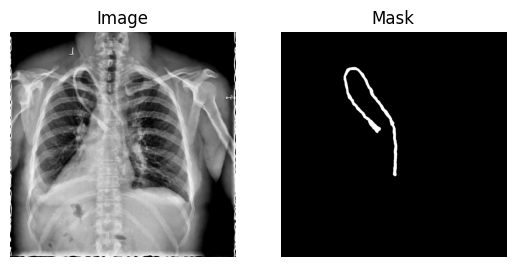

In [ ]:

img, mask = val_dataset[0]
print(img.shape, mask.shape)

plt.subplot(1, 2, 1)
# Access the image tensor at index 0, remove channel dim, convert to numpy
plt.imshow(img.squeeze().numpy(), cmap='gray')
plt.title('Image')
plt.axis('off')

plt.subplot(1, 2, 2)
# Access the mask tensor at index 1, remove channel dim, convert to numpy
plt.imshow(mask.squeeze().numpy(), cmap='gray')
plt.title('Mask')
plt.axis('off')

plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR, LinearLR, SequentialLR
from torch.utils.data import DataLoader
import numpy as np
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import os
from datetime import datetime
from torch.cuda.amp import GradScaler, autocast
# from torchmetrics import DiceScore

# All previous imports remain the same

class SegmentationLoss(nn.Module):
    def __init__(self, alpha=0.5, beta=0.5, gamma=2.0, smooth=1e-6):
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.smooth = smooth

    def forward(self, pred, target):
        # Ensure float32 for mixed precision
        pred = pred.float()
        target = target.float()

        # BCEWithLogitsLoss (handles logits)
        bce_loss = F.binary_cross_entropy_with_logits(pred, target)

        # Dice Loss with prob conversion
        pred_prob = torch.sigmoid(pred)
        intersection = (pred_prob * target).sum()
        dice_loss = 1 - (2. * intersection + self.smooth) / (pred_prob.sum() + target.sum() + self.smooth)

        # Stabilized Focal Loss
        focal_loss = self._focal_loss(pred, target)

        return (1 - self.alpha - self.beta) * bce_loss + self.alpha * dice_loss + self.beta * focal_loss

    def _focal_loss(self, pred, target):
        bce = F.binary_cross_entropy_with_logits(pred, target, reduction='none')
        pt = torch.exp(-bce.clamp(min=-100, max=50))  # Critical stabilization
        return ((1 - pt) ** self.gamma * bce).mean()

# class SegmentationLoss(nn.Module):
#     def __init__(self, alpha=0.5, beta=0.5, gamma=2.0, delta=0.1, smooth=1e-6):
#         super().__init__()
#         self.alpha = alpha    # Weight for Dice Loss
#         self.beta = beta      # Weight for Focal Loss
#         self.gamma = gamma    # Gamma for Focal Loss
#         self.delta = delta   # Weight for SimSSM Loss
#         self.smooth = smooth  # Smoothing factor

#     def forward(self, pred, target):
#         # Ensure float32 for mixed precision
#         pred = pred.float()
#         target = target.float()

#         # BCEWithLogitsLoss (handles logits)
#         bce_loss = F.binary_cross_entropy_with_logits(pred, target)

#         # Dice Loss with prob conversion
#         pred_prob = torch.sigmoid(pred)
#         intersection = (pred_prob * target).sum()
#         dice_loss = 1 - (2. * intersection + self.smooth) / (pred_prob.sum() + target.sum() + self.smooth)

#         # Stabilized Focal Loss
#         focal_loss = self._focal_loss(pred, target)

#         # SimSSM Loss (Structural Similarity)
#         sim_ssm_loss = self._sim_ssm_loss(pred_prob, target)

#         return (
#             (1 - self.alpha - self.beta - self.delta) * bce_loss +
#             self.alpha * dice_loss +
#             self.beta * focal_loss +
#             self.delta * sim_ssm_loss
#         )

#     def _focal_loss(self, pred, target):
#         bce = F.binary_cross_entropy_with_logits(pred, target, reduction='none')
#         pt = torch.exp(-bce.clamp(min=-100, max=50))  # Stabilized computation
#         return ((1 - pt) ** self.gamma * bce).mean()

#     def _sim_ssm_loss(self, pred, target):
#         """
#         Computes the SimSSM (Similarity-based Structured Semantic Matching) loss.
#         This encourages structural similarity between prediction and target.
#         """
#         # Flatten spatial dimensions (B, C, H, W) -> (B, C, H*W)
#         pred_flat = pred.view(pred.size(0), pred.size(1), -1)
#         target_flat = target.view(target.size(0), target.size(1), -1)

#         # Compute similarity matrices (B, C, H*W, H*W)
#         pred_sim = torch.bmm(pred_flat.transpose(1, 2), pred_flat)
#         target_sim = torch.bmm(target_flat.transpose(1, 2), target_flat)

#         # Normalize similarity matrices
#         pred_sim = F.softmax(pred_sim, dim=-1)
#         target_sim = F.softmax(target_sim, dim=-1)

#         # Compute KL divergence between similarity distributions
#         loss = F.kl_div(
#             pred_sim.log(),
#             target_sim,
#             reduction='batchmean',
#             log_target=False
#         )

#         return loss

#  Function to free up GPU memory
def free_gpu_memory():
    torch.cuda.empty_cache()
    import gc
    gc.collect()

class Trainer:
    def __init__(self, model, train_loader, val_loader, device, num_epochs=100, experiment_name="", lr=0.0001):
        self.model = model.to(device)
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.device = device
        self.num_epochs = num_epochs

        # Setup experiment directory
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        self.experiment_dir = f"experiments/{experiment_name}_{timestamp}" if experiment_name else f"experiments/exp_{timestamp}"
        os.makedirs(f"{self.experiment_dir}/plots", exist_ok=True)
        os.makedirs(f"{self.experiment_dir}/models", exist_ok=True)

        # Optimizer with filtered parameters
        self.optimizer = optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=lr,
            weight_decay=0.001
        )

        # Mixed precision training
        self.scaler = GradScaler()

        # LR scheduling with warmup
        warmup_epochs = 5
        self.scheduler = SequentialLR(
            self.optimizer,
            schedulers=[
                LinearLR(self.optimizer, start_factor=0.01, end_factor=1.0, total_iters=warmup_epochs),
                CosineAnnealingLR(self.optimizer, T_max=num_epochs-warmup_epochs, eta_min=1e-6)
            ],
            milestones=[warmup_epochs]
        )

        # Enhanced loss function
        self.criterion = SegmentationLoss(alpha=0.4, beta=0.3)  # Tune these weights



        # Track metrics
        self.train_loss = []
        self.val_loss = []
        self.val_dice = []
        self.lr_history = []
        self.best_dice = 0.0

    def train_epoch(self, epoch):
        self.model.train()
        epoch_loss = 0.0

        with tqdm(self.train_loader, unit="batch", desc=f"Epoch {epoch+1}/{self.num_epochs} [Train]") as pbar:
            for images, masks in pbar:
                images = images.to(self.device, non_blocking=True)
                masks = masks.to(self.device, non_blocking=True)

                # Mixed precision forward
                with autocast():
                    outputs = self.model(images)
                    loss = self.criterion(outputs, masks)

                # Backward pass
                self.optimizer.zero_grad()
                self.scaler.scale(loss).backward()
                self.scaler.step(self.optimizer)
                self.scaler.update()

                epoch_loss += loss.item()
                pbar.set_postfix({"loss": f"{loss.item():.4f}", "lr": f"{self.optimizer.param_groups[0]['lr']:.2e}"})

        return epoch_loss / len(self.train_loader)


    def validate_epoch(self, epoch):
        self.model.eval()
        val_loss = 0.0
        dice_scores = []

        with tqdm(self.val_loader, unit="batch", desc=f"Epoch {epoch+1}/{self.num_epochs} [Val]") as pbar:
            with torch.no_grad():
                for images, masks in pbar:
                    images = images.to(self.device, non_blocking=True)
                    masks = masks.to(self.device, non_blocking=True)

                    with autocast():
                        outputs = self.model(images)
                        loss = self.criterion(outputs, masks)

                    val_loss += loss.item()

                    # Calculate Dice score
                    preds = torch.sigmoid(outputs)
                    # Move tensors to CPU before calculating dice
                    dice = self._calculate_dice(preds.cpu(), masks.cpu())
                    dice_scores.append(dice)

                    pbar.set_postfix({"val_loss": f"{loss.item():.4f}", "dice": f"{dice:.4f}"})

        mean_dice = np.mean(dice_scores)
        return val_loss / len(self.val_loader), mean_dice

    def _calculate_dice(self, pred, target, smooth=1e-6):
        # Ensure tensors are on CPU if they weren't already
        pred = pred.cpu()
        target = target.cpu()

        pred = (pred > 0.5).float()
        intersection = (pred * target).sum()
        return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

    def _update_plots(self, epoch):
        """Update training metrics visualization"""
        plt.figure(figsize=(18, 6))

        # Loss plot
        plt.subplot(1, 3, 1)
        plt.plot(self.train_loss, label='Train', color='blue')
        plt.plot(self.val_loss, label='Val', color='red')
        plt.title('Training & Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)

        # Dice plot
        plt.subplot(1, 3, 2)
        plt.plot(self.val_dice, label='Val Dice', color='green')
        plt.title('Validation Dice Score')
        plt.xlabel('Epochs')
        plt.ylabel('Dice')
        plt.legend()
        plt.grid(True)

        # LR plot
        plt.subplot(1, 3, 3)
        plt.plot(self.lr_history, label='Learning Rate', color='purple')
        plt.title('Learning Rate Schedule')
        plt.xlabel('Epochs')
        plt.ylabel('LR')
        plt.legend()
        plt.grid(True)
        plt.yscale('log')

        plt.tight_layout()
        plt.savefig(f"{self.experiment_dir}/plots/metrics_epoch_{epoch+1}.png", dpi=120)
        plt.close()

    def train(self):
        print(f"\n🚀 Starting training for {self.num_epochs} epochs...")
        print(f"📂 Experiment directory: {self.experiment_dir}")
        print(f"⚡ Using device: {self.device}")
        print(f"🔧 Loss function: {self.criterion.__class__.__name__}\n")

        for epoch in tqdm(range(self.num_epochs), desc="Training Progress"):
            train_loss = self.train_epoch(epoch)
            val_loss, val_dice = self.validate_epoch(epoch)

            self.scheduler.step()
            self.train_loss.append(train_loss)
            self.val_loss.append(val_loss)
            self.val_dice.append(val_dice)
            self.lr_history.append(self.optimizer.param_groups[0]['lr'])

            self._update_plots(epoch)

            if val_dice > self.best_dice:
                self.best_dice = val_dice
                torch.save({
                    'epoch': epoch+1,
                    'model_state_dict': self.model.state_dict(),
                    'optimizer_state_dict': self.optimizer.state_dict(),
                    'loss': val_loss,
                    'dice': val_dice,
                }, f"{self.experiment_dir}/models/best_model.pth")
                tqdm.write(f"🎉 New best model: Dice {val_dice:.4f} at epoch {epoch+1}")

        self._save_final_artifacts()
        print(f"\n🏁 Training completed! Best Dice: {self.best_dice:.4f}")
        return self.model.state_dict() # Return state dict of the best model

    def _save_final_artifacts(self):
        """Save all training artifacts"""
        torch.save({
            'epoch': self.num_epochs,
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'train_loss': self.train_loss,
            'val_loss': self.val_loss,
            'val_dice': self.val_dice,
        }, f"{self.experiment_dir}/models/final_model.pth")

        np.savez(
            f"{self.experiment_dir}/plots/training_metrics.npz",
            train_loss=np.array(self.train_loss),
            val_loss=np.array(self.val_loss),
            val_dice=np.array(self.val_dice),
            lr_history=np.array(self.lr_history)
        )

        self._generate_final_plot()

    def _generate_final_plot(self):
        """Generate high-quality final plot"""
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

        ax1.plot(self.train_loss, label='Train', color='blue')
        ax1.plot(self.val_loss, label='Val', color='red')
        ax1.set_title('Training & Validation Loss')
        ax1.set_xlabel('Epochs')
        ax1.legend()
        ax1.grid(True)

        ax2.plot(self.val_dice, label='Val Dice', color='green')
        ax2.set_title('Validation Dice Score')
        ax2.set_xlabel('Epochs')
        ax2.legend()
        ax2.grid(True)

        ax3.plot(self.lr_history, label='Learning Rate', color='purple')
        ax3.set_title('Learning Rate Schedule')
        ax3.set_xlabel('Epochs')
        ax3.set_yscale('log')
        ax3.legend()
        ax3.grid(True)

        plt.tight_layout()
        plt.savefig(f"{self.experiment_dir}/plots/final_metrics.png", dpi=300)
        plt.savefig(f"{self.experiment_dir}/plots/final_metrics.pdf")
        plt.close()

In [ ]:
import warnings
warnings.filterwarnings("ignore")

if __name__ == "__main__":
    # Initialize components outside the Trainer class's __main__ block
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_catheter = UNet_3Plus(in_channels=1)
    # Data loaders are defined above this __main__ block
    # train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
    # val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)

    # Train
    trainer = Trainer(
        model=model_catheter,
        train_loader=train_data_loader, # Use the data loaders defined outside __main__
        val_loader=val_data_loader,   # Use the data loaders defined outside __main__
        device=device,
        num_epochs=100,
        experiment_name="catheter_unet"
    )
    # The train method now returns the best weights state dictionary
    best_weights_state_dict_cath = trainer.train()

    # Load best weights for inference
    # model1.load_state_dict(best_weights_state_dict)


🚀 Starting training for 100 epochs...
📂 Experiment directory: experiments/catheter_unet_20250526_131827
⚡ Using device: cuda
🔧 Loss function: SegmentationLoss



Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 1/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.3730 at epoch 1


Epoch 2/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.5930 at epoch 2


Epoch 3/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6783 at epoch 3


Epoch 4/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7991 at epoch 4


Epoch 5/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8302 at epoch 5


Epoch 6/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 7/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 8/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 9/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8428 at epoch 9


Epoch 10/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 11/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8613 at epoch 11


Epoch 12/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 13/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8816 at epoch 13


Epoch 14/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 15/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 16/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 17/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 18/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8843 at epoch 18


Epoch 19/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 20/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 20/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 21/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 22/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 23/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 24/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 25/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 26/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8969 at epoch 26


Epoch 27/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 28/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 28/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 29/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 30/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 30/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 31/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 32/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 32/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 33/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 33/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 34/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 34/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 35/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 35/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 36/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 36/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 37/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 37/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 38/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 38/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9021 at epoch 38


Epoch 39/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 39/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 40/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 40/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 41/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 41/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 42/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 42/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 43/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 43/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 44/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 44/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 45/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 45/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 46/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 46/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 47/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 47/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 48/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 48/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 49/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 49/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 50/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 50/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9067 at epoch 50


Epoch 51/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 51/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 52/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 52/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 53/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 53/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 54/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 54/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 55/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 55/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 56/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 56/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 57/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 57/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9078 at epoch 57


Epoch 58/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 58/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 59/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 59/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 60/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 60/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 61/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 61/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 62/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 62/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 63/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 63/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 64/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 64/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 65/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 65/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 66/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 66/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 67/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 67/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 68/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 68/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 69/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 69/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9114 at epoch 69


Epoch 70/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 70/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 71/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 71/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 72/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 72/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 73/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 73/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 74/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 74/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 75/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 75/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 76/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 76/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 77/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 77/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 78/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 78/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 79/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 79/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 80/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 80/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 81/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 81/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 82/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 82/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9143 at epoch 82


Epoch 83/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 83/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 84/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 84/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 85/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 85/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 86/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 86/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 87/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 87/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 88/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 88/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 89/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 89/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 90/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 90/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 91/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 91/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 92/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 92/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 93/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 93/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9202 at epoch 93


Epoch 94/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 94/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 95/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 95/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 96/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 96/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 97/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 97/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 98/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 98/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 99/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 99/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 100/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 100/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]


🏁 Training completed! Best Dice: 0.9202


In [ ]:
# Load best catheter model
model_catheter.load_state_dict(best_weights_state_dict_cath)

<All keys matched successfully>

In [227]:
transform_image = transforms.Compose([
    transforms.Resize((960, 960)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485), std=(0.229))
])



from torchmetrics.functional.segmentation import dice_score

def calculate_dice_score(y_true, y_pred):
    score = dice_score(y_true, y_pred, num_classes=2,  average='micro')
    # get average score
    return score.cpu().numpy().mean()

def get_binary_masks(masks):


    return (masks > 0).astype(np.float32)





def predict_catheter_segmentation(image_path, unet_model, device, size=960, transform=transform_image, clip=2, deep_sup=False):
    # Open the image using PIL and convert to grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # image_pil = Image.fromarray(image)
    unet_model = unet_model.to(device)

    # Convert to NumPy array
    # image_np = np.array(image_pil)

    # Apply CLAHE
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=(8, 8))
    clahe_image_np = clahe.apply(image)

    # Resize image while maintaining aspect ratio
    resized_aspx = resize_to_square(img=clahe_image_np, target_size=size)

    # Convert back to PIL Image
    clahe_image_pil = Image.fromarray(resized_aspx)

    # Apply transform (e.g., ToTensor, normalization)
    if transform:
        image_tensor = transform(clahe_image_pil).unsqueeze(0).to(device) # unsqueeze adds a sample dimenstion (N, C, W, H)
    else:
        image_tensor = transforms.ToTensor()(clahe_image_pil).unsqueeze(0).to(device)

    # Predict mask using U-Net++
    unet_model.eval()
    with torch.inference_mode():

        if deep_sup:
            output = unet_model(image_tensor)
            output = torch.sigmoid(output[0])
            # mask = (output > 0.5).float()
        else:
          output = unet_model(image_tensor)
        # output = torch.sigmoid(output)
        mask = (output > 0.5).float()

    return mask.cpu().squeeze().numpy(), resized_aspx


def convert_to_tensor(np_array):
    return torch.from_numpy(np_array)

def get_id_from_path(path: str) -> str:
    return path.split('/')[-1].replace('.tif', '')


import random
import cv2
import matplotlib.pyplot as plt

def visualize_predictions(model, test_image_paths, test_mask_paths, device, num_samples=5, clip_limit=2, figsize=(20, 10), deep_sup=False):
    """
    Visualize model predictions by showing original images, predicted masks, and ground truth masks.

    Args:
        model: The trained model for making predictions
        test_image_paths: List of paths to test images
        test_mask_paths: List of paths to corresponding ground truth masks
        device: Device to run the model on ('cuda' or 'cpu')
        num_samples: Number of random samples to visualize (default: 5)
        clip_limit: CLAHE clip limit (default: 2)
        figsize: Size of the matplotlib figure (default: (20, 10))
    """
    # Randomly select samples
    random_indices = random.sample(range(len(test_image_paths)), min(num_samples, len(test_image_paths)))
    random_images = [test_image_paths[i] for i in random_indices]
    random_masks = [test_mask_paths[i] for i in random_indices]

    # Create subplots
    fig, axes = plt.subplots(3, len(random_images), figsize=figsize)

    # If only one sample, axes will be 1D - convert to 2D for consistency
    if len(random_images) == 1:
        axes = axes.reshape(3, 1)

    for i, img_path in enumerate(random_images):
        # Read ground truth mask
        actual_mask = resize_to_square(cv2.imread(random_masks[i], cv2.IMREAD_GRAYSCALE), target_size=960)

        binary_mask = get_binary_masks(actual_mask)
        # actual

        # Get prediction
        predicted_mask, clahe_image = predict_catheter_segmentation(
            img_path, model, device, clip=clip_limit, deep_sup=deep_sup
        )

        dice = calculate_dice_score(convert_to_tensor(binary_mask).unsqueeze(0), convert_to_tensor(predicted_mask).unsqueeze(0))

        # Plot original image
        axes[0, i].imshow(clahe_image, cmap='gray')
        axes[0, i].set_title(f"id: {get_id_from_path(img_path)}")
        axes[0, i].axis('off')

        # Plot predicted mask
        axes[1, i].imshow(predicted_mask, cmap='gray')
        axes[1, i].set_title(f'Predicted mask--DSC:{dice:.3f}')
        axes[1, i].axis('off')

        # Plot ground truth mask
        axes[2, i].imshow(binary_mask, cmap='gray')
        axes[2, i].set_title("Ground truth")
        axes[2, i].axis('off')

    plt.tight_layout()
    plt.show()



In [ ]:
!cp -r /content/experiments/atrium_unet_deep_sup_20250526_235713 /content/drive/MyDrive/msc_uhasselt/experiments/atrium_unet

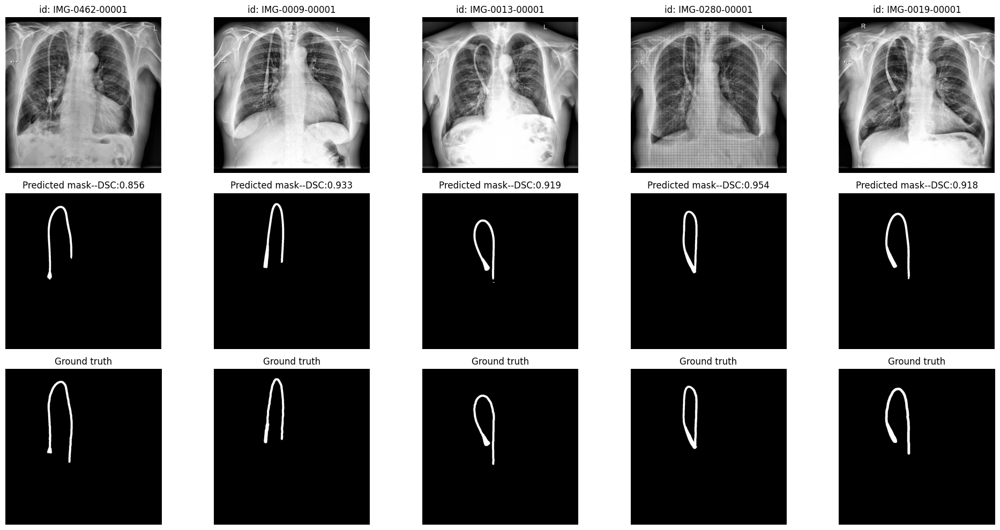

In [ ]:
visualize_predictions(model_catheter, valid_test_paths, valid_test_cathetr_paths, device, num_samples=5, clip_limit=2, figsize=(20, 10))

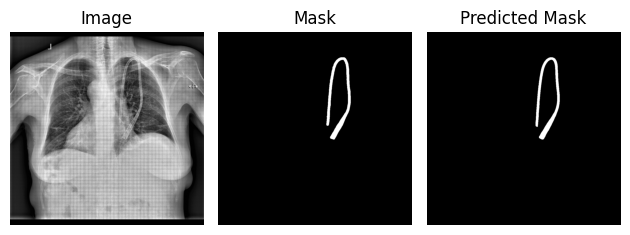

In [ ]:
idx = 12

img, mask = val_dataset[idx]
# mask = val_dataset[idx][1]


model_catheter.eval()
with torch.no_grad():
    out = model_catheter(img.unsqueeze(0).to(device))
    # out = torch.sigmoid(out)
    pred = (out > 0.5).float()
    pred = pred.squeeze().cpu().numpy()

    plt.subplot(1, 3, 1)
    plt.imshow(img.squeeze(), cmap="gray")
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask.squeeze(), cmap="gray")
    plt.title("Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()

In [ ]:
from math import pi
from torch.utils.data import DataLoader

import albumentations as A

train_transform = A.Compose([
    # --- Spatial Augmentations (applied to both image & mask) ---
    # Horizontal flips are NOT recommended (atrial anatomy is side-specific)
    # A.VerticalFlip(p=0.3),  # Safe since atrial orientation is preserved vertically

    # Small-angle rotations (±15°)
    A.Rotate(limit=15, p=0.4, border_mode=cv2.BORDER_CONSTANT),

    # Mild elastic deformations (preserves overall structure)


    # Optional: Combined with ElasticTransform
    A.OneOf([
        A.ElasticTransform(
        alpha=50,  # Reduced from default (120) for finer deformations
        sigma=5,    # Smaller sigma for localized warping
        alpha_affine=10,
        p=0.3
    ),



    # Finer GridDistortion (controlled warping)
    A.GridDistortion(
        num_steps=5,           # Smoother transitions (default=5)
        distort_limit=0.15,    # Reduced from 0.3 (gentler distortion)
        interpolation=cv2.INTER_LINEAR,
        border_mode=cv2.BORDER_CONSTANT,
        p=0.3
    )
    ], p=0.3),

    # --- Intensity Augmentations ---
    # A.CLAHE(clip_limit=2.0, p=0.3),
    A.RandomBrightnessContrast(
        brightness_limit=(-0.1, 0.1),
        contrast_limit=(-0.1, 0.1),
        p=0.3
    ),
    A.GaussNoise(std_range=(0.01, 0.02), p=0.2),
    # --- Normalization ---
    A.Normalize(mean=(0.485), std=(0.229)),
    A.ToTensorV2(),
])

val_transform = A.Compose([
    A.Normalize(mean=(0.485), std=(0.229)),
    A.ToTensorV2(),
])



train_dataset_atria_seg = SegmentationDataset(
    image_paths=valid_images_paths,
    mask_paths=valid_atrial_paths,
    image_size=960,
    transform=train_transform,
    apply_clahe=True,
    clahe_limit=3.5 # Atrium needs higher clahe
)

val_dataset_atria_seg = SegmentationDataset(
    image_paths=valid_test_paths,
    mask_paths=valid_test_atrial_paths,
    image_size=960,
    transform=val_transform,
    apply_clahe=True,
    clahe_limit=3.5
)

train_data_loader = DataLoader(train_dataset_atria_seg, batch_size=2, shuffle=True, pin_memory=True)
val_data_loader = DataLoader(val_dataset_atria_seg, batch_size=2, shuffle=False, pin_memory=True)



In [ ]:
if __name__ == "__main__":
    # Initialize components outside the Trainer class's __main__ block
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_atrium = UNet_3Plus(in_channels=1)
    # Data loaders are defined above this __main__ block
    # train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
    # val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)

    # Train
    trainer = Trainer(
        model=model_atrium,
        train_loader=train_data_loader, # Use the data loaders defined outside __main__
        val_loader=val_data_loader,   # Use the data loaders defined outside __main__
        device=device,
        num_epochs=100,
        experiment_name="atrium_unet"
    )
    # The train method now returns the best weights state dictionary
    best_weights_state_dict_atrium = trainer.train()

    # Load best weights for inference
    # model1.load_state_dict(best_weights_state_dict)


🚀 Starting training for 120 epochs...
📂 Experiment directory: experiments/atrium_unet_20250526_180651
⚡ Using device: cuda
🔧 Loss function: SegmentationLoss



Training Progress:   0%|          | 0/120 [00:00<?, ?it/s]

Epoch 1/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 1/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.0192 at epoch 1


Epoch 2/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 2/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.1545 at epoch 2


Epoch 3/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 3/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.1595 at epoch 3


Epoch 4/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 4/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.3567 at epoch 4


Epoch 5/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 5/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 6/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 6/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.3814 at epoch 6


Epoch 7/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 7/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.4576 at epoch 7


Epoch 8/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 8/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 9/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 9/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 10/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 10/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.4992 at epoch 10


Epoch 11/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 11/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 12/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 12/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.5384 at epoch 12


Epoch 13/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 13/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 14/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 14/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.5750 at epoch 14


Epoch 15/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 15/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.5996 at epoch 15


Epoch 16/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 16/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 17/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 17/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6148 at epoch 17


Epoch 18/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 18/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 19/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 19/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 20/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 20/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6216 at epoch 20


Epoch 21/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 21/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6568 at epoch 21


Epoch 22/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 22/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 23/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 23/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 24/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 24/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 25/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 25/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 26/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 26/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 27/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 27/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 28/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 28/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6657 at epoch 28


Epoch 29/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 29/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6758 at epoch 29


Epoch 30/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 30/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 31/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 31/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 32/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 32/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 33/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 33/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 34/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 34/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 35/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 35/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6926 at epoch 35


Epoch 36/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 36/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 37/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 37/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 38/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 38/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7013 at epoch 38


Epoch 39/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 39/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 40/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 40/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 41/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 41/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 42/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 42/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7027 at epoch 42


Epoch 43/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 43/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7078 at epoch 43


Epoch 44/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 44/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7155 at epoch 44


Epoch 45/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 45/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 46/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 46/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 47/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 47/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7374 at epoch 47


Epoch 48/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 48/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 49/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 49/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 50/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 50/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 51/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 51/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 52/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 52/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 53/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 53/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 54/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 54/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 55/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 55/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 56/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 56/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 57/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 57/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 58/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 58/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 59/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 59/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 60/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 60/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7388 at epoch 60


Epoch 61/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 61/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 62/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 62/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 63/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 63/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 64/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 64/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 65/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 65/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 66/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 66/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 67/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 67/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 68/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 68/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 69/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 69/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 70/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 70/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 71/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 71/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 72/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 72/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 73/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 73/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 74/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 74/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 75/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 75/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 76/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 76/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 77/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 77/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 78/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 78/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 79/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 79/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7477 at epoch 79


Epoch 80/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 80/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 81/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 81/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 82/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 82/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 83/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 83/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 84/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 84/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 85/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 85/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 86/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 86/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 87/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 87/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 88/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 88/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 89/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 89/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 90/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 90/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 91/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 91/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 92/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 92/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 93/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 93/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 94/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 94/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7549 at epoch 94


Epoch 95/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 95/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 96/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 96/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 97/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 97/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 98/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 98/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 99/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 99/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 100/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 100/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 101/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 101/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 102/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 102/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 103/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 103/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 104/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 104/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 105/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 105/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 106/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 106/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 107/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 107/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 108/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 108/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 109/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 109/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 110/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 110/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 111/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 111/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 112/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 112/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 113/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 113/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 114/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 114/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 115/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 115/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 116/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 116/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 117/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 117/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 118/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 118/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 119/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 119/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 120/120 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 120/120 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]


🏁 Training completed! Best Dice: 0.7549


In [ ]:
model_atrium.load_state_dict(best_weights_state_dict_atrium)

<All keys matched successfully>

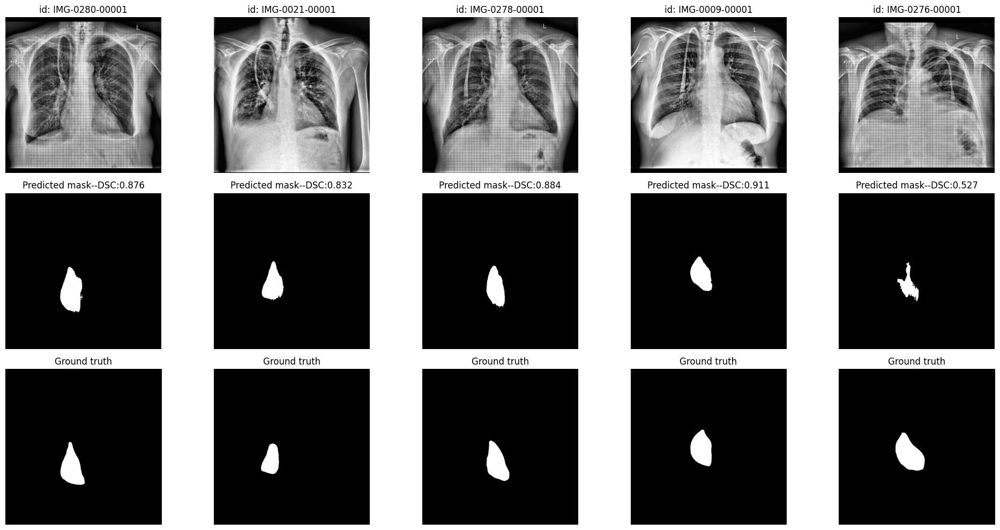

In [ ]:
visualize_predictions(model_atrium, valid_test_paths, valid_test_atrial_paths, device, num_samples=5, clip_limit=3.5, figsize=(20, 10))

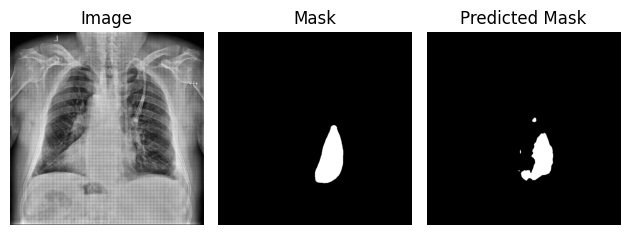

In [ ]:
idx = 19
model_atrium.eval()
img, mask = val_dataset_atria_seg[idx]


with torch.inference_mode():
    out = model_atrium(img.unsqueeze(0).to(device))
    # out = torch.sigmoid(out)
    pred = (out > 0.5).float()
    pred = pred.squeeze().cpu().numpy()

plt.subplot(1, 3, 1)
plt.imshow(img.squeeze(), cmap="gray")
plt.title("Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mask.squeeze(), cmap="gray")
plt.title("Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(pred, cmap="gray")
plt.title("Predicted Mask")
plt.axis("off")

plt.tight_layout()

In [ ]:



class UNet3PlusDeepSupTrainer(Trainer):
    def __init__(self, model, train_loader, val_loader, device, num_epochs=100, experiment_name=""):
        super().__init__(model, train_loader, val_loader, device, num_epochs, experiment_name)
        # Use same optimizer, scheduler, etc.
        # Expect self.criterion to accept prediction & mask pairs

        # Weights for each deep supervision output, adjust as needed
        self.ds_weights = [0.5, 0.25, 0.125, 0.0625, 0.0625]

    def train_epoch(self, epoch):
        self.model.train()
        epoch_loss = 0.0

        with tqdm(self.train_loader, unit="batch", desc=f"Epoch {epoch+1}/{self.num_epochs} [Train]") as pbar:
            for images, masks in pbar:
                images = images.to(self.device, non_blocking=True)
                masks = masks.to(self.device, non_blocking=True)

                # Mixed precision forward
                with autocast():
                    outs = self.model(images)  # d1, d2, d3, d4, d5
                    # All outputs are same shape as mask
                    total_loss = 0
                    for idx, out in enumerate(outs):
                        total_loss += self.ds_weights[idx] * self.criterion(out, masks)

                self.optimizer.zero_grad()
                self.scaler.scale(total_loss).backward()
                self.scaler.step(self.optimizer)
                self.scaler.update()

                epoch_loss += total_loss.item()
                pbar.set_postfix({"loss": f"{total_loss.item():.4f}", "lr": f"{self.optimizer.param_groups[0]['lr']:.2e}"})

        return epoch_loss / len(self.train_loader)

    def validate_epoch(self, epoch):
        self.model.eval()
        val_loss = 0.0
        dice_scores = []

        with tqdm(self.val_loader, unit="batch", desc=f"Epoch {epoch+1}/{self.num_epochs} [Val]") as pbar:
            with torch.no_grad():
                for images, masks in pbar:
                    images = images.to(self.device, non_blocking=True)
                    masks = masks.to(self.device, non_blocking=True)

                    with autocast():
                        outs = self.model(images)
                        total_loss = 0
                        for idx, out in enumerate(outs):
                            total_loss += self.ds_weights[idx] * self.criterion(out, masks)

                    val_loss += total_loss.item()

                    # Use the first output (highest resolution) for Dice calculation
                    preds = torch.sigmoid(outs[0])
                    dice = self._calculate_dice(preds.cpu(), masks.cpu())
                    dice_scores.append(dice)

                    pbar.set_postfix({"val_loss": f"{total_loss.item():.4f}", "dice": f"{dice:.4f}"})

        mean_dice = np.mean(dice_scores)
        return val_loss / len(self.val_loader), mean_dice


In [ ]:
if __name__ == "__main__":
    # Initialize components outside the Trainer class's __main__ block
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_atrium_deep_sup = UNet_3Plus_DeepSup(in_channels=1)
    # Data loaders are defined above this __main__ block
    # train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
    # val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)

    # Train
    trainer = UNet3PlusDeepSupTrainer(
        model=model_atrium_deep_sup,
        train_loader=train_data_loader, # Use the data loaders defined outside __main__
        val_loader=val_data_loader,   # Use the data loaders defined outside __main__
        device=device,
        # num_epochs=150,
        experiment_name="atrium_unet_deep_sup"
    )
    # The train method now returns the best weights state dictionary
    best_weights_state_dict_atrium_deep_sup = trainer.train()

    # Load best weights for inference
    # model1.load_state_dict(best_weights_state_dict)


🚀 Starting training for 100 epochs...
📂 Experiment directory: experiments/atrium_unet_deep_sup_20250526_235713
⚡ Using device: cuda
🔧 Loss function: SegmentationLoss



Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 1/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.0627 at epoch 1


Epoch 2/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.2858 at epoch 2


Epoch 3/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.3441 at epoch 3


Epoch 4/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.5203 at epoch 4


Epoch 5/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.5266 at epoch 5


Epoch 6/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 7/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6888 at epoch 7


Epoch 8/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 9/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7037 at epoch 9


Epoch 10/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 11/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7486 at epoch 11


Epoch 12/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 13/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 14/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 15/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 16/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 17/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7554 at epoch 17


Epoch 18/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 19/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7675 at epoch 19


Epoch 20/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 20/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 21/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7843 at epoch 21


Epoch 22/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 23/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 24/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 25/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 26/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 27/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 28/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 28/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 29/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 30/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 30/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 31/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 32/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 32/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 33/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 33/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 34/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 34/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 35/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 35/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 36/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 36/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 37/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 37/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 38/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 38/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 39/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 39/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 40/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 40/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 41/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 41/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 42/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 42/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 43/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 43/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7855 at epoch 43


Epoch 44/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 44/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7855 at epoch 44


Epoch 45/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 45/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 46/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 46/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 47/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 47/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 48/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 48/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 49/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 49/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 50/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 50/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 51/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 51/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 52/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 52/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7912 at epoch 52


Epoch 53/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 53/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 54/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 54/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 55/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 55/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 56/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 56/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 57/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 57/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 58/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 58/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 59/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 59/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 60/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 60/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 61/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 61/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 62/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 62/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 63/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 63/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 64/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 64/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 65/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 65/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 66/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 66/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 67/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 67/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 68/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 68/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 69/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 69/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 70/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 70/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 71/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 71/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 72/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 72/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 73/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 73/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 74/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 74/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 75/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 75/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 76/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 76/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 77/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 77/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 78/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 78/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 79/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 79/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 80/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 80/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 81/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 81/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 82/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 82/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 83/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 83/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 84/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 84/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 85/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 85/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7927 at epoch 85


Epoch 86/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 86/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 87/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 87/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 88/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 88/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 89/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 89/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 90/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 90/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 91/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 91/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 92/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 92/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 93/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 93/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 94/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 94/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 95/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 95/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 96/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 96/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 97/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 97/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 98/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 98/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 99/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 99/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 100/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 100/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]


🏁 Training completed! Best Dice: 0.7927


In [ ]:
model_atrium_deep_sup.load_state_dict(best_weights_state_dict_atrium_deep_sup)

<All keys matched successfully>

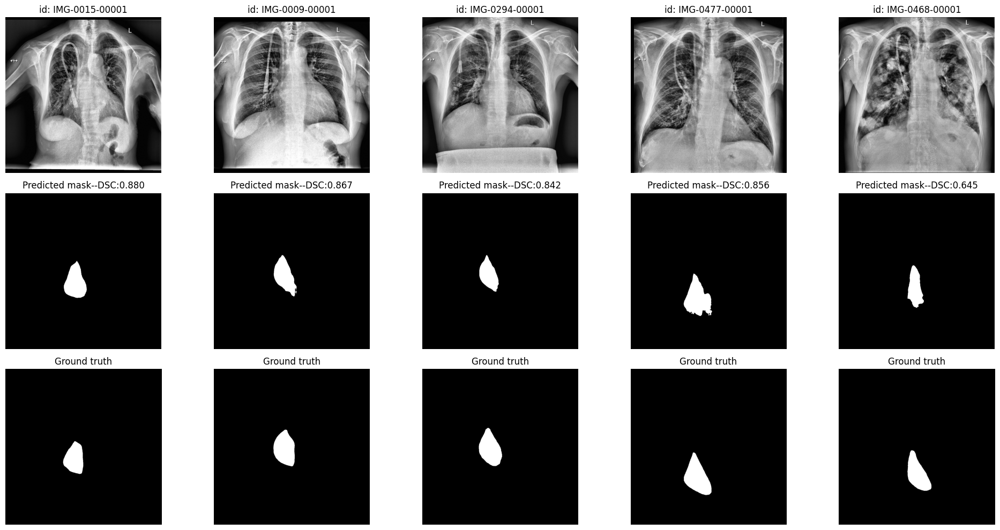

In [ ]:
visualize_predictions(model_atrium_deep_sup, valid_test_paths, valid_test_atrial_paths, device, num_samples=5, clip_limit=3.5, figsize=(20, 10), deep_sup=True)

In [ ]:

train_transform = A.Compose([
    # --- Spatial Augmentations ---
    A.HorizontalFlip(p=0.3),  # Safe for atrial anatomy

    # Finer GridDistortion (controlled warping)

    A.Rotate(limit=15, p=0.4, border_mode=cv2.BORDER_CONSTANT),
    A.GridDistortion(
        num_steps=5,           # Smoother transitions (default=5)
        distort_limit=0.15,    # Reduced from 0.3 (gentler distortion)
        interpolation=cv2.INTER_LINEAR,
        border_mode=cv2.BORDER_CONSTANT,
        p=0.3
    ),

    # Optional: Combined with ElasticTransform
    A.OneOf([
        A.ElasticTransform(
            alpha=120,         # Magnitude of distortion (reduced from default)
            sigma=120 * 0.05,  # Smoothness (sigma=alpha*factor)
            # alpha_affine=0,    # No longer a parameter - removed
            p=0.5
        ),
        A.GridDistortion(distort_limit=0.1, p=0.5)  # Even subtler variant
    ], p=0.4),

    # --- Intensity Augmentations ---
    # A.CLAHE(clip_limit=2.0, p=0.3),
    A.RandomBrightnessContrast(
        brightness_limit=(-0.1, 0.1),
        contrast_limit=(-0.1, 0.1),
        p=0.4
    ),
    A.GaussNoise(std_range=(0.01, 0.02), p=0.2),
    # --- Normalization ---
    A.Normalize(mean=(0.485), std=(0.229)),
    A.ToTensorV2(),
])

val_transform = A.Compose([
    A.Normalize(mean=(0.485), std=(0.229)),
    A.ToTensorV2(),
])




train_dataset = SegmentationDataset(
    image_paths=valid_images_paths,
    mask_paths=valid_cathetr_paths,
    image_size=960,
    transform=train_transform,
    apply_clahe=True
)

val_dataset = SegmentationDataset(
    image_paths=valid_test_paths,
    mask_paths=valid_test_cathetr_paths,
    image_size=960,
    transform=val_transform,
    apply_clahe=True
)

train_data_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, pin_memory=True)
val_data_loader = DataLoader(val_dataset, batch_size=2, shuffle=False,  pin_memory=True)


In [118]:
if __name__ == "__main__":
    # Initialize components outside the Trainer class's __main__ block
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_cath_deep_sup = UNet_3Plus_DeepSup(in_channels=1)
    # Data loaders are defined above this __main__ block
    # train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
    # val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)

    # Train
    trainer = UNet3PlusDeepSupTrainer(
        model=model_cath_deep_sup,
        train_loader=train_data_loader, # Use the data loaders defined outside __main__
        val_loader=val_data_loader,   # Use the data loaders defined outside __main__
        device=device,
        # num_epochs=150,
        experiment_name="catheter_unet_deep_sup"
    )
    # The train method now returns the best weights state dictionary
    best_weights_state_dict_cath_deep_sup = trainer.train()

    # Load best weights for inference
    # model1.load_state_dict(best_weights_state_dict)


🚀 Starting training for 100 epochs...
📂 Experiment directory: experiments/catheter_unet_deep_sup_20250527_043857
⚡ Using device: cuda
🔧 Loss function: SegmentationLoss



Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 1/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.0695 at epoch 1


Epoch 2/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 2/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.5345 at epoch 2


Epoch 3/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 3/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.6875 at epoch 3


Epoch 4/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 4/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7564 at epoch 4


Epoch 5/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 5/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.7597 at epoch 5


Epoch 6/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 6/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8075 at epoch 6


Epoch 7/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 7/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8162 at epoch 7


Epoch 8/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 8/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8451 at epoch 8


Epoch 9/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 9/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 10/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 10/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8486 at epoch 10


Epoch 11/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 11/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8524 at epoch 11


Epoch 12/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 12/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 13/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 13/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8638 at epoch 13


Epoch 14/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 14/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 15/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 15/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 16/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 16/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8729 at epoch 16


Epoch 17/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 17/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 18/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 18/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 19/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 19/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 20/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 20/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 21/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 21/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 22/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 22/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8763 at epoch 22


Epoch 23/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 23/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 24/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 24/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 25/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 25/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 26/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 26/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8874 at epoch 26


Epoch 27/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 27/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.8953 at epoch 27


Epoch 28/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 28/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 29/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 29/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 30/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 30/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 31/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 31/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 32/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 32/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 33/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 33/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 34/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 34/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 35/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 35/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 36/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 36/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9038 at epoch 36


Epoch 37/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 37/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 38/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 38/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 39/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 39/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 40/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 40/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 41/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 41/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 42/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 42/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 43/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 43/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 44/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 44/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 45/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 45/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 46/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 46/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 47/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 47/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 48/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 48/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 49/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 49/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 50/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 50/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 51/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 51/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 52/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 52/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 53/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 53/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9076 at epoch 53


Epoch 54/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 54/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 55/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 55/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9090 at epoch 55


Epoch 56/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 56/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9092 at epoch 56


Epoch 57/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 57/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 58/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 58/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 59/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 59/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 60/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 60/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 61/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 61/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 62/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 62/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 63/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 63/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 64/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 64/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 65/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 65/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 66/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 66/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 67/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 67/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 68/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 68/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 69/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 69/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 70/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 70/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9122 at epoch 70


Epoch 71/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 71/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 72/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 72/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 73/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 73/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 74/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 74/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 75/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 75/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 76/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 76/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 77/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 77/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 78/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 78/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 79/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 79/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 80/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 80/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 81/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 81/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 82/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 82/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 83/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 83/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 84/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 84/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 85/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 85/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 86/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 86/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 87/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 87/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

🎉 New best model: Dice 0.9190 at epoch 87


Epoch 88/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 88/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 89/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 89/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 90/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 90/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 91/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 91/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 92/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 92/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 93/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 93/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 94/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 94/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 95/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 95/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 96/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 96/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 97/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 97/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 98/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 98/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 99/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 99/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]

Epoch 100/100 [Train]:   0%|          | 0/100 [00:00<?, ?batch/s]

Epoch 100/100 [Val]:   0%|          | 0/23 [00:00<?, ?batch/s]


🏁 Training completed! Best Dice: 0.9190


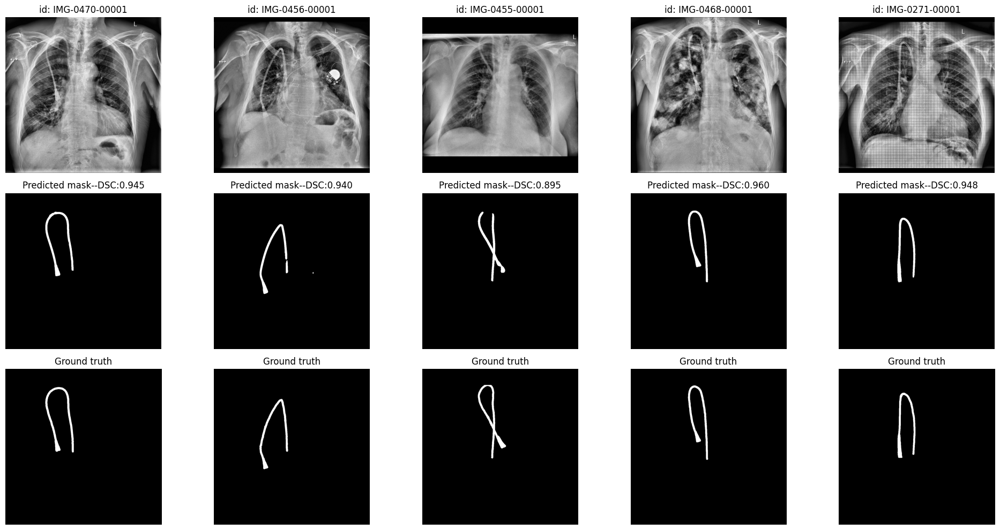

In [123]:
visualize_predictions(model_cath_deep_sup, valid_test_paths, valid_test_cathetr_paths, device, num_samples=5, clip_limit=3.5, figsize=(20, 10), deep_sup=True)

### Get Masks from trained

In [125]:
# !cp -r /content/experiments/catheter_unet_deep_sup_20250527_043857 /content/drive/MyDrive/msc_uhasselt/experiments/catheter_unet/

In [228]:
# Ensure models are saved correctly
unet_atrium_model_load = UNet_3Plus_DeepSup(in_channels=1)
# Load the entire checkpoint dictionary first
checkpoint = torch.load('/content/drive/MyDrive/msc_uhasselt/experiments/atrium_unet/atrium_unet_deep_sup_20250526_235713/models/best_model.pth', weights_only=False)

unet_atrium_model_load.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [229]:
unet_cath_model_load = UNet_3Plus_DeepSup(in_channels=1)
checkpoint = torch.load('/content/drive/MyDrive/msc_uhasselt/experiments/catheter_unet/catheter_unet_deep_sup_20250527_043857/models/best_model.pth', weights_only=False)

unet_cath_model_load.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [230]:
unet_atrium_base_model = UNet_3Plus(in_channels=1)
checkpoint = torch.load('/content/drive/MyDrive/msc_uhasselt/experiments/atrium_unet/atrium_unet_20250526_180651/models/best_model.pth', weights_only=False)

unet_atrium_base_model.load_state_dict(checkpoint['model_state_dict'])

unet_cath_base_model = UNet_3Plus(in_channels=1)
checkpoint = torch.load('/content/drive/MyDrive/msc_uhasselt/experiments/catheter_unet/catheter_unet_20250526_131827/models/best_model.pth', weights_only=False)

unet_cath_base_model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

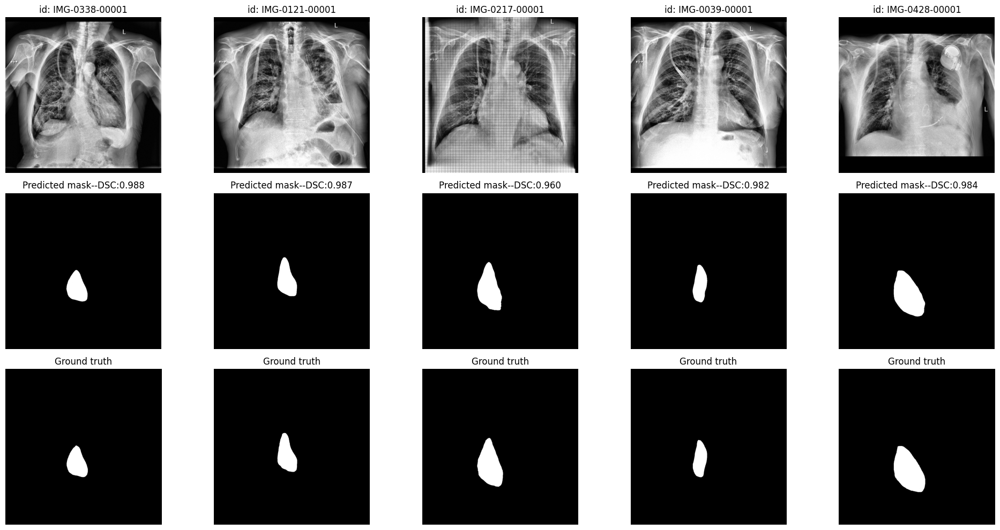

In [231]:
visualize_predictions(unet_atrium_model_load, valid_images_paths, valid_atrial_paths, device, num_samples=5, clip_limit=3.5, figsize=(20, 10), deep_sup=True)

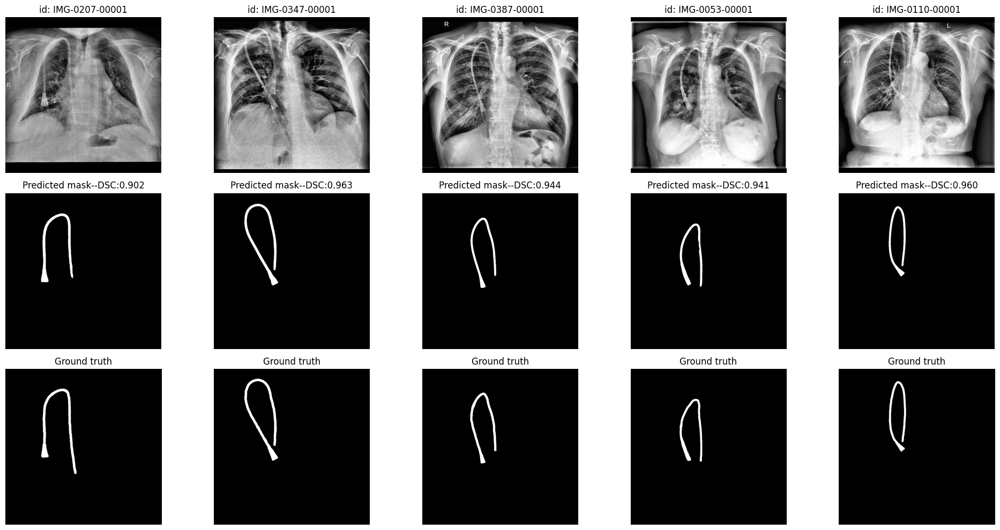

In [232]:
visualize_predictions(unet_cath_model_load, valid_images_paths, valid_cathetr_paths, device, num_samples=5, clip_limit=3.5, figsize=(20, 10), deep_sup=True)

In [234]:
def get_individual_masks(image_paths, unet_model, device, clahe=None, clip=2, deep_sup=False):
    all_predictions = []
    clahe_images = []

    for image_path in image_paths:
        mask, clahe_image = predict_catheter_segmentation(image_path, unet_model, device, clip=clip, deep_sup=deep_sup)
        all_predictions.append(mask)

        if clahe:
            clahe_images.append(clahe_image)

    return np.array(all_predictions), np.array(clahe_images) if clahe else None


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Get mask from pretained models
* For both mask, their respective base UNet+++ and UNet+++ with deep supervision will be obtained


In [235]:
def process_masks(image_paths, unet_cath_model, unet_atrium_model, device, clip_atrium=3.5, deep_sup=True):
    """
    Processes images to get predicted catheter and atrial masks using trained models.

    Args:
        image_paths (list[str]): List of paths to the images.
        unet_cath_model: The trained model for catheter segmentation.
        unet_atrium_model: The trained model for atrial segmentation.
        device: The device to run the models on ('cuda' or 'cpu').
        clip_atrium (float): CLAHE clip limit for atrium images.
        deep_sup (bool): Whether the models use deep supervision.

    Returns:
        tuple: Contains four tensors:
               - catheter_masks_tensor (torch.Tensor)
               - atrial_masks_tensor (torch.Tensor)
               - clahe_images (list[np.ndarray])
    """
    catheter_masks = []
    atrial_masks = []
    clahe_images = []

    for img_path in tqdm(image_paths, desc="Processing Images"):
        # Process for catheter mask
        cath_mask, clahe_image = predict_catheter_segmentation(
            img_path, unet_cath_model, device, deep_sup=deep_sup
        )
        catheter_masks.append(cath_mask)
        clahe_images.append(clahe_image)

        # Process for atrial mask
        atrial_mask, _ = predict_catheter_segmentation(
            img_path, unet_atrium_model, device, clip=clip_atrium, deep_sup=deep_sup
        )
        atrial_masks.append(atrial_mask)

    # Convert lists of numpy arrays to single numpy arrays
    catheter_masks_np = np.stack(catheter_masks)
    atrial_masks_np = np.stack(atrial_masks)

    # Convert numpy arrays to tensors
    catheter_masks_tensor = convert_np_tensor(catheter_masks_np)
    atrial_masks_tensor = convert_np_tensor(atrial_masks_np)


    return catheter_masks_tensor, atrial_masks_tensor, clahe_images

In [236]:
train_catheter_tensor_base, train_atrial_tensor_base, train_clahe_images = process_masks(valid_images_paths,
                                                                                 unet_cath_base_model,
                                                                                 unet_atrium_base_model,
                                                                                 device, deep_sup=False)

test_catheter_tensor_base, test_atrial_tensor_base, test_clahe_images = process_masks(valid_test_paths,
                                                                                 unet_cath_base_model,
                                                                                 unet_atrium_base_model,
                                                                                 device, deep_sup=False)

Processing Images:   0%|          | 0/200 [00:00<?, ?it/s]

Processing Images:   0%|          | 0/45 [00:00<?, ?it/s]

In [237]:
train_catheter_tensor_ds, train_atrial_tensor_ds, _ = process_masks(valid_images_paths,
                                                                                 unet_cath_model_load,
                                                                                 unet_atrium_model_load,
                                                                                 device, deep_sup=True)
test_catheter_tensor_ds, test_atrial_tensor_ds, _ = process_masks(valid_test_paths,
                                                                                 unet_cath_model_load,
                                                                                 unet_atrium_model_load,
                                                                                 device, deep_sup=True)


Processing Images:   0%|          | 0/200 [00:00<?, ?it/s]

Processing Images:   0%|          | 0/45 [00:00<?, ?it/s]

Load the ground truth masks for both the catheter and the right atria border, this will enable us to obtain validation ("test") metrics for the different segmentation models.

In [238]:
def get_orginal_maks(train_paths, test_paths, size = 960):

  return read_image_frompath(train_paths, size=size), read_image_frompath(test_paths, size=size)

def get_binary_masks(masks):


  return (masks > 0).float()

def convert_np_tensor(np_array):

  if isinstance(np_array, torch.Tensor):
    return np_array
  elif isinstance(np_array, np.ndarray):
    return torch.from_numpy(np_array)
  elif isinstance(np_array, list):
    return torch.stack([torch.from_numpy(arr) for arr in np_array])
  else:
    raise ValueError("Unsupported data type")

# No changes are needed in the calling code blocks.
# The function get_binary_masks will then receive a single tensor.
# The rest of the code should now work as intended assuming the shapes are compatible
# for subsequent operations.

In [239]:
original_catheter_mask_train, original_catheter_mask_test = get_orginal_maks(valid_cathetr_paths, valid_test_cathetr_paths)

original_atrial_mask_train, original_atrial_mask_test = get_orginal_maks(valid_atrial_paths, valid_test_atrial_paths)

In [240]:
original_catheter_mask_train[0].shape

(960, 960)

In [241]:
ground_truth_catheter_tensor_train = get_binary_masks(convert_np_tensor(original_catheter_mask_train))
ground_truth_atrial_tensor_train = get_binary_masks(convert_np_tensor(original_atrial_mask_train))

ground_truth_catheter_tensor_test = get_binary_masks(convert_np_tensor(original_catheter_mask_test))
ground_truth_atrial_tensor_test = get_binary_masks(convert_np_tensor(original_atrial_mask_test))

In [8]:
from torchmetrics.functional.segmentation import dice_score, mean_iou

def calculate_dice_score(y_true, y_pred):
    score = dice_score(y_true, y_pred, num_classes=2,  average='micro')
    # get average score
    return score.cpu().numpy().mean()

def calculate_iou_score(y_true, y_pred):
    # Convert floating point tensors (0 or 1) to long integer type (0 or 1)
    # mean_iou expects class indices or boolean
    y_true = y_true.long()
    y_pred = y_pred.long()
    score = mean_iou(y_true, y_pred, include_background=False, num_classes=2)
    # get average score
    return score.cpu().numpy().mean()

# Now call the function with the converted tensors
calculate_iou_score(ground_truth_catheter_tensor_train, train_catheter_tensor_base)

ModuleNotFoundError: No module named 'torchmetrics'

In [7]:
dice_atrium_base_train = calculate_dice_score(ground_truth_atrial_tensor_train, train_atrial_tensor_base)
dice_atrium_base_test = calculate_dice_score(ground_truth_atrial_tensor_test, test_atrial_tensor_base)
dice_atrium_ds_train = calculate_dice_score(ground_truth_atrial_tensor_train, train_atrial_tensor_ds)
dice_atrium_ds_test = calculate_dice_score(ground_truth_atrial_tensor_test, test_atrial_tensor_ds)

# IOU score for atrial models
iou_atrium_base_train = calculate_iou_score(ground_truth_atrial_tensor_train, train_atrial_tensor_base)
iou_atrium_base_test = calculate_iou_score(ground_truth_atrial_tensor_test, test_atrial_tensor_base)
iou_atrium_ds_train = calculate_iou_score(ground_truth_atrial_tensor_train, train_atrial_tensor_ds)
iou_atrium_ds_test = calculate_iou_score(ground_truth_atrial_tensor_test, test_atrial_tensor_ds)
# Dice score for catheter models
dice_cath_base_train = calculate_dice_score(ground_truth_catheter_tensor_train, train_catheter_tensor_base)
dice_cath_base_test = calculate_dice_score(ground_truth_catheter_tensor_test, test_catheter_tensor_base)
dice_cath_ds_train = calculate_dice_score(ground_truth_catheter_tensor_train, train_catheter_tensor_ds)
dice_score_cath_ds_test = calculate_dice_score(ground_truth_catheter_tensor_test, test_catheter_tensor_ds)

# IOU score for catheter models
iou_cath_base_train = calculate_iou_score(ground_truth_catheter_tensor_train, train_catheter_tensor_base)
iou_cath_base_test = calculate_iou_score(ground_truth_catheter_tensor_test, test_catheter_tensor_base)
iou_cath_ds_train = calculate_iou_score(ground_truth_catheter_tensor_train, train_catheter_tensor_ds)
iou_cath_ds_test = calculate_iou_score(ground_truth_catheter_tensor_test, test_catheter_tensor_ds)

print(f'Model: Base UNet+++; Atrial Segmentation-- Dice: {dice_atrium_base_test:.4f}; mIoU: {iou_atrium_base_test:.4f} , CVC segmentation--Dice {dice_cath_base_test:.4f};   mIoU: {iou_cath_base_test:.4f}')
print(f'==\n')
print(f'Model: UNet+++ with Deep Supervision; Atrial Segmentation--Dice: {dice_atrium_ds_test:.4f}; mIoU: {iou_atrium_ds_test:.4f} , CVC segmentation--Dice {dice_score_cath_ds_test:.4f};   mIoU: {iou_cath_ds_test:.4f}')



NameError: name 'calculate_dice_score' is not defined

In [5]:
# Download and save utils file from git hub
url = 'https://raw.githubusercontent.com/Blaise-bf/thesis-files/refs/heads/main/utills.py'

save_file = 'utills.py'

save_file_locally(url, save_file)

File utills.py not found. Downloading from GitHub...
Successfully downloaded utills.py


In [6]:
from utills import *